In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def show(img):
    img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    plt.imshow(img, cmap='gray')
    plt.xticks([]), plt.yticks([])
    plt.show()

In [3]:
def plot_image(image_1, image_2,title_1="Orignal",title_2="New Image"):
    plt.figure(figsize=(10,10))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB))
    plt.title(title_1)
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB))
    plt.title(title_2)
    plt.show()

Section_6:-

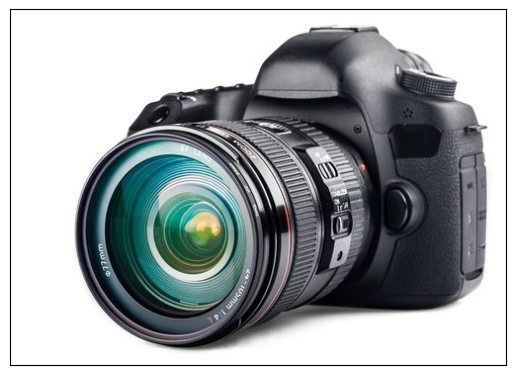

In [4]:
img = cv2.imread('camera.jpg')
show(img)

In [6]:
def binary_thresholding(image, threshold_value = 127, max_val = 255): 
    
    ret,thresh1 = cv2.threshold(image, threshold_value, max_val, cv2.THRESH_BINARY)
    return thresh1

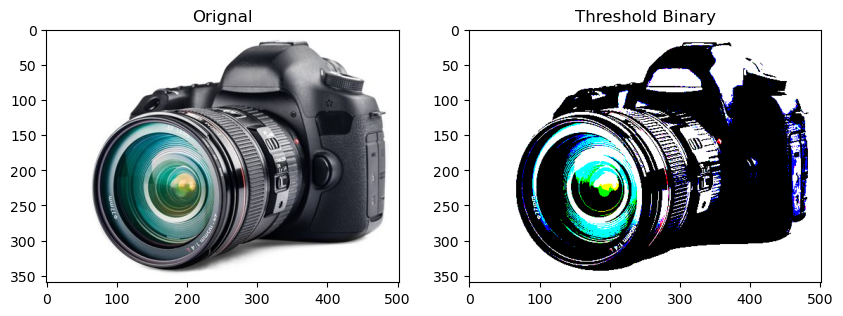

In [7]:
image_thresh=binary_thresholding(img)

plot_image(img, image_thresh, title_2="Threshold Binary")

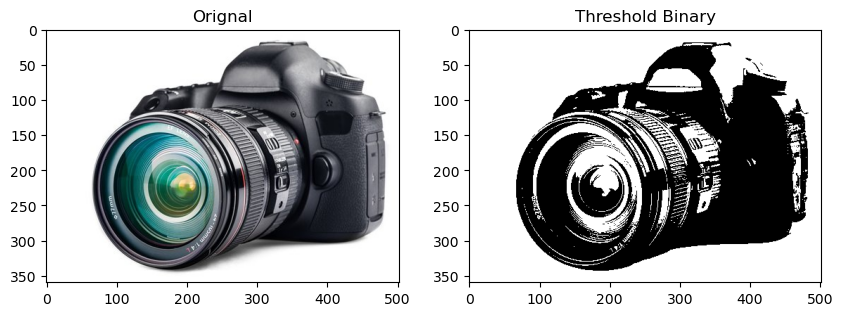

In [8]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

image_thresh=binary_thresholding(gray)

plot_image(img, image_thresh, title_2="Threshold Binary")

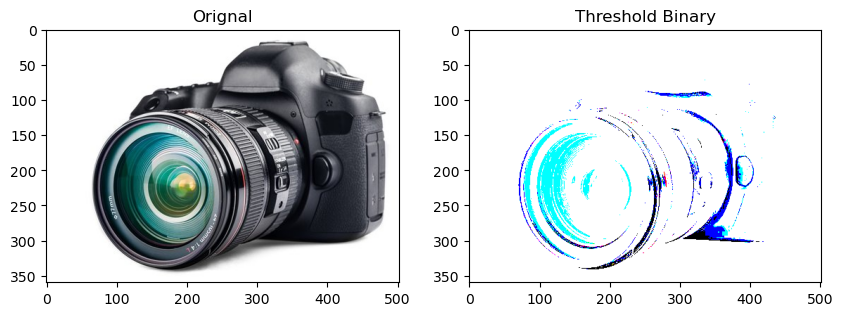

In [9]:
image_thresh=binary_thresholding(img, 10, 255)

plot_image(img, image_thresh, title_2="Threshold Binary")

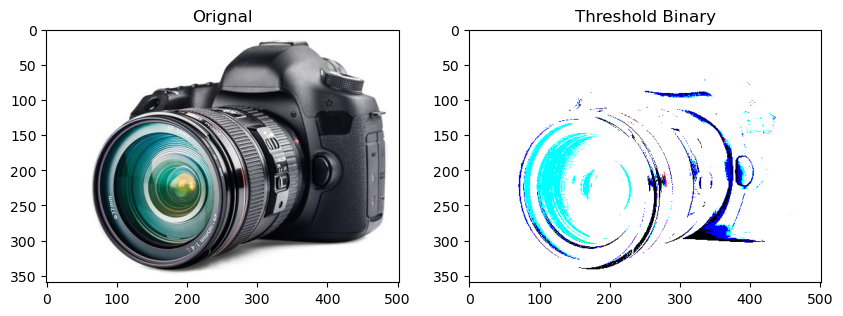

In [10]:
image_thresh=binary_thresholding(img, 12, 255)

plot_image(img, image_thresh, title_2="Threshold Binary")

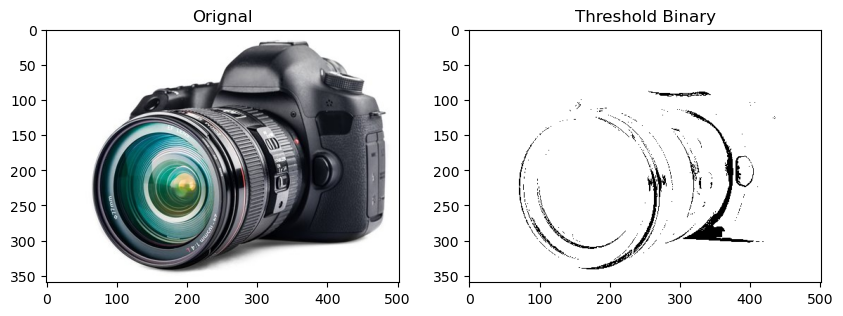

In [12]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

image_thresh=binary_thresholding(gray, 10, 255)

plot_image(img, image_thresh, title_2="Threshold Binary")

In [13]:
def adaptive_mean_thresholding(img, max_Value=255, blok_size=11, C_dst=2):
    
    th = cv2.adaptiveThreshold(img, max_Value, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, blok_size, C_dst)

    return th

In [15]:
def get_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

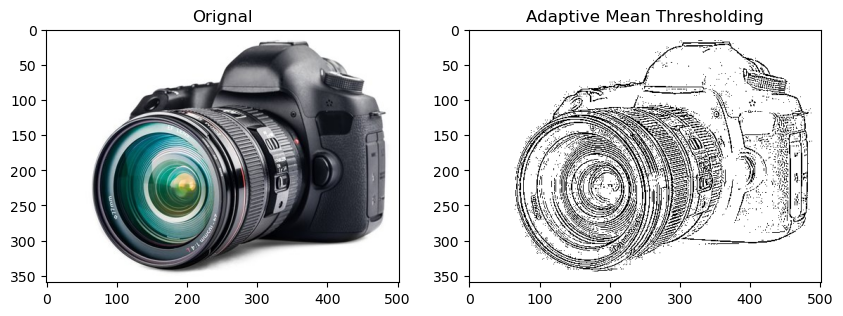

In [16]:
img_gray = get_grayscale(img)

image_mean_thresh=adaptive_mean_thresholding(img_gray, 255, 3, 5)

plot_image(img, image_mean_thresh, title_2='Adaptive Mean Thresholding')

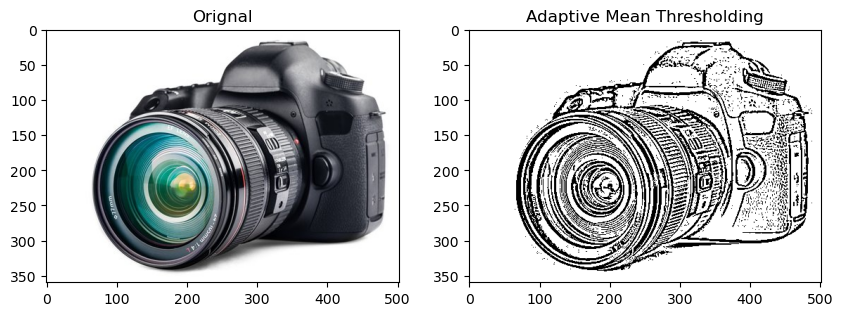

In [17]:
img_gray=get_grayscale(img)

image_mean_thresh=adaptive_mean_thresholding(img_gray, 255, 7, 4)

plot_image(img, image_mean_thresh, title_2='Adaptive Mean Thresholding')

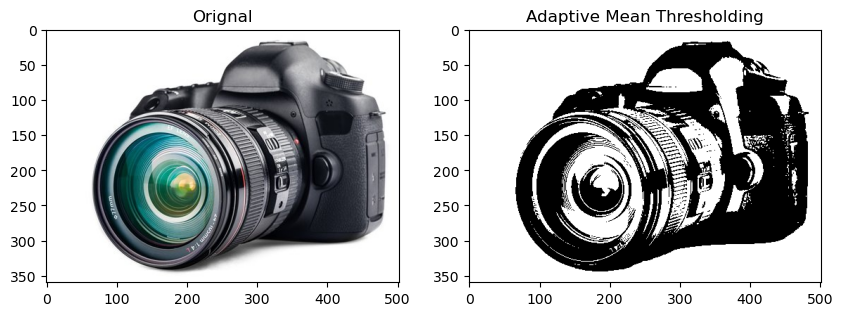

In [18]:
img_gray = get_grayscale(img)

image_mean_thresh=adaptive_mean_thresholding(img_gray, 255, 99, 3)

plot_image(img, image_mean_thresh, title_2='Adaptive Mean Thresholding')

Adaptive Gaussian Threshold

In [19]:
def adaptive_gaussian_thresholding(img, max_Value=255, blok_size=11, C_dst=2):
    
    th = cv2.adaptiveThreshold(img, max_Value, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, blok_size, C_dst)
    return th

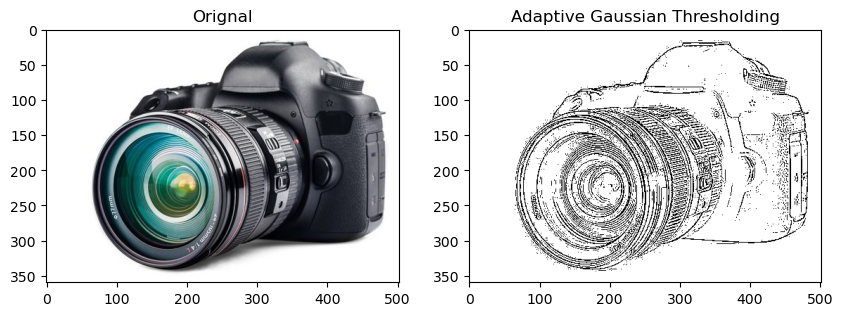

In [20]:
img_gray = get_grayscale(img)

image_mean_thresh=adaptive_gaussian_thresholding(img_gray, 255, 3, 5)

plot_image(img, image_mean_thresh, title_2='Adaptive Gaussian Thresholding')

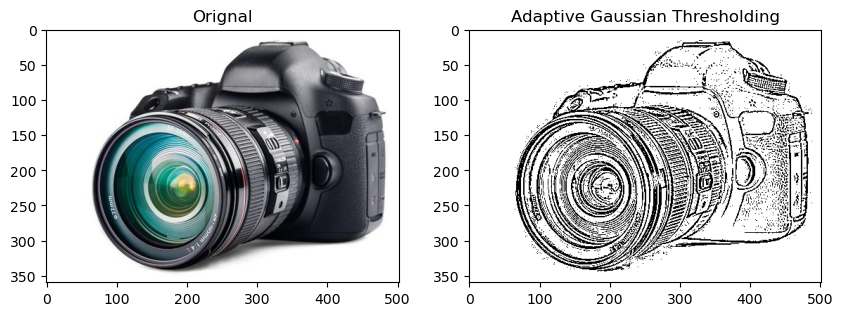

In [21]:
img_gray = get_grayscale(img)

th2 = adaptive_gaussian_thresholding(img_gray, 255, 7, 4)

plot_image(img, th2, title_2='Adaptive Gaussian Thresholding')


In [22]:
def otsu_thresholding(image, value=0, m=255):
    
    return cv2.threshold(image, value, m, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

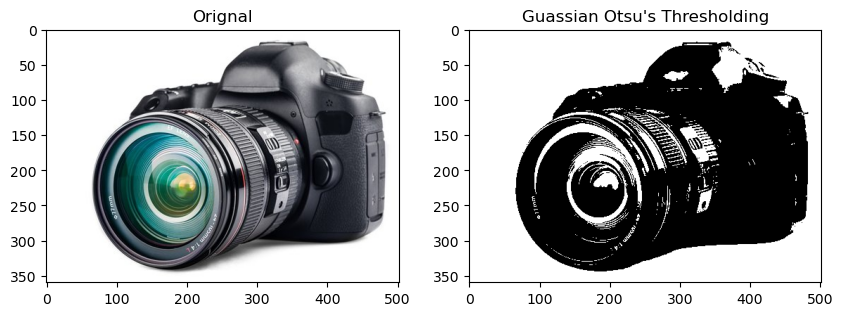

In [24]:
img_gray = get_grayscale(img)

image_otsu_thresh=otsu_thresholding(img_gray, 125, 255)

plot_image(img, image_otsu_thresh, title_2="Guassian Otsu's Thresholding")

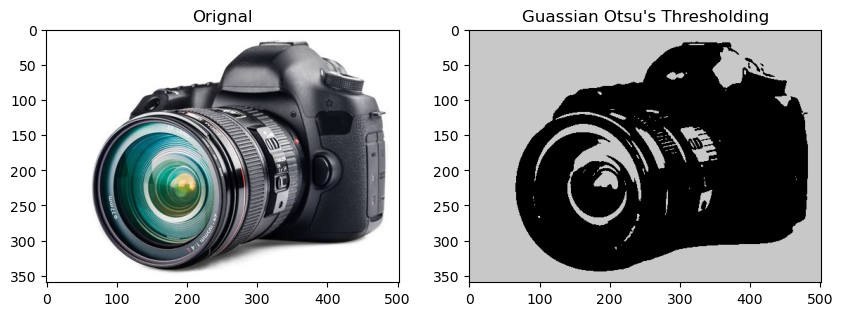

In [26]:
def gaussian_blur(image):
    return cv2.GaussianBlur(image, (5, 5), 0)
blur = gaussian_blur(img)

img_gray = get_grayscale(blur)

image_otsu_thresh=otsu_thresholding(img_gray, 0, 200)

plot_image(img, image_otsu_thresh, title_2="Guassian Otsu's Thresholding")

Section 7:-

In [27]:
def erode(image, kernel=(5, 5), iterations=1):
    
    return cv2.erode(image, np.ones(kernel,np.uint8), iterations)

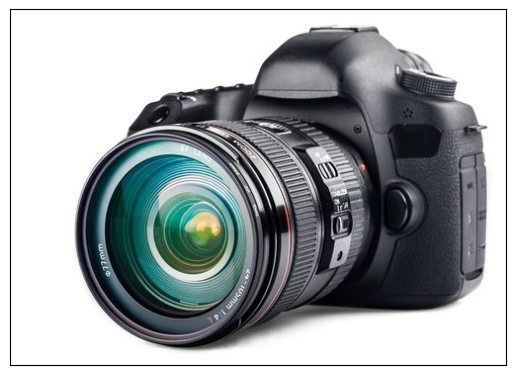

In [28]:
show(img)

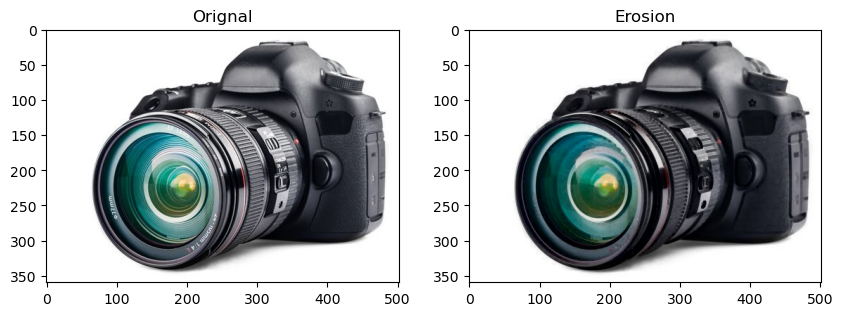

In [29]:
image_erosion=erode(img, (3, 3), 1)

plot_image(img, image_erosion, title_2="Erosion")

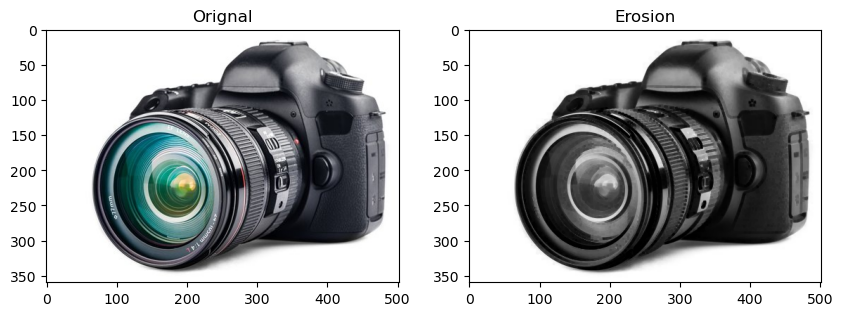

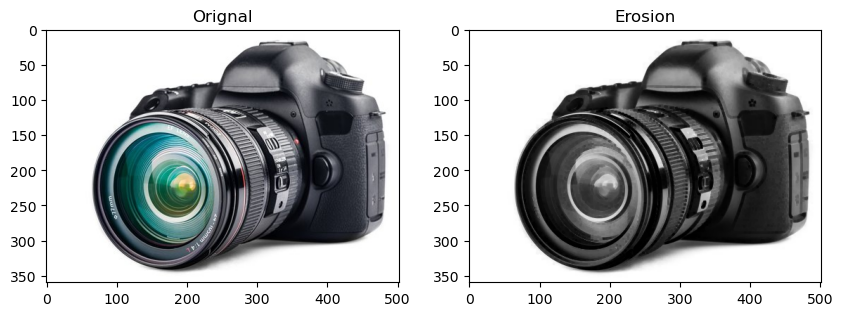

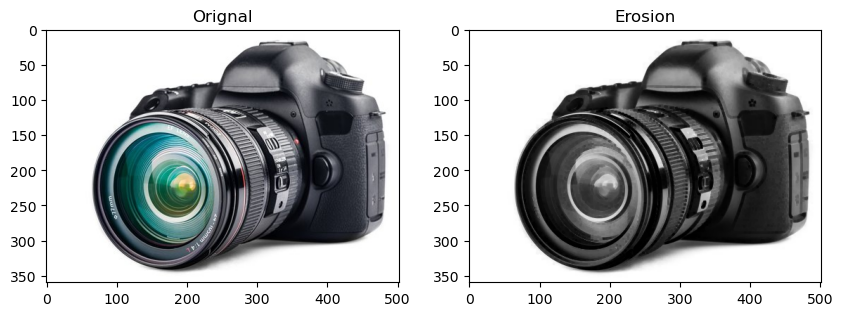

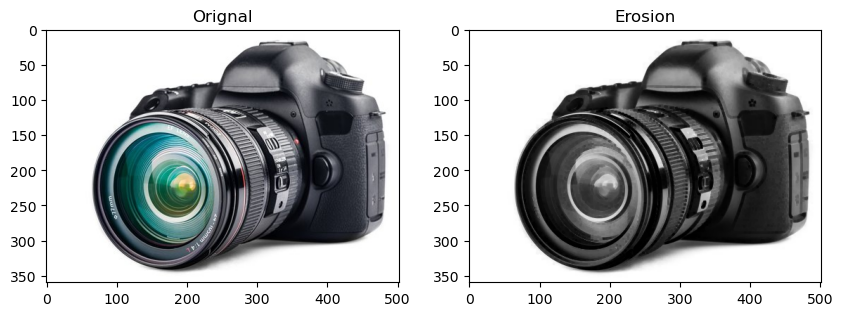

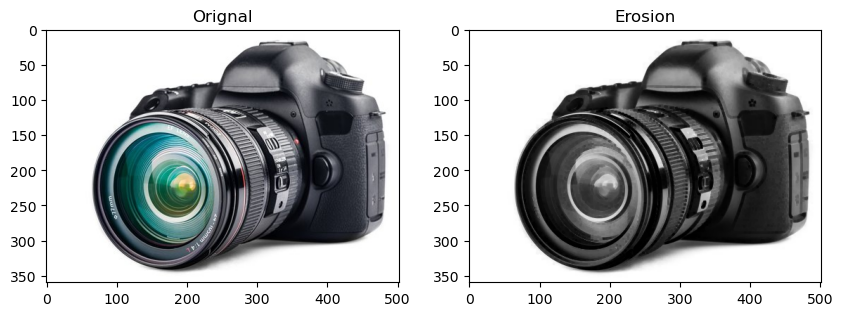

In [30]:
for i in range(1, 6):
    image = get_grayscale(img)

    image_erosion=erode(image, (3, 3), i)

    plot_image(img, image_erosion, title_2="Erosion")

In [31]:
def dilation(image, kernel=(5, 5), iterations=1):
    
    return cv2.dilate(image, np.ones(kernel, np.uint8), iterations)

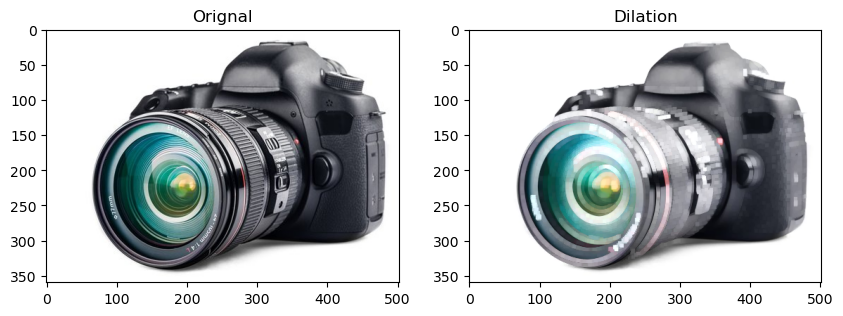

In [32]:
image_dilation=dilation(img)

plot_image(img, image_dilation, title_2="Dilation")

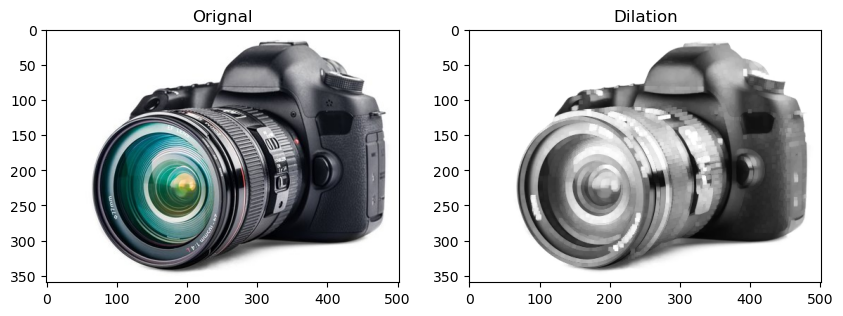

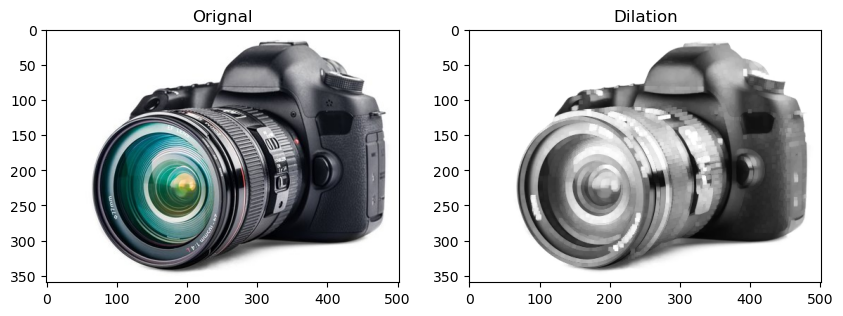

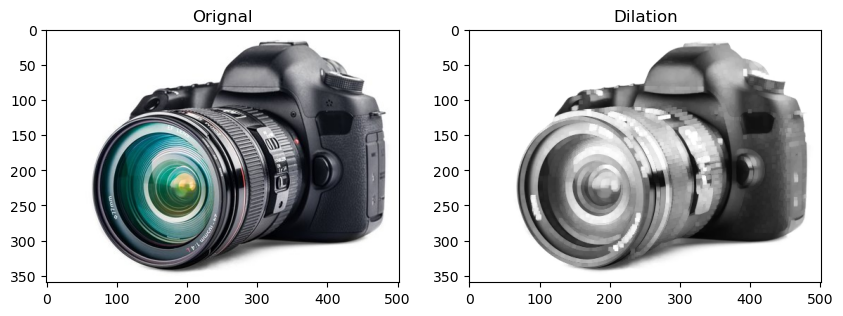

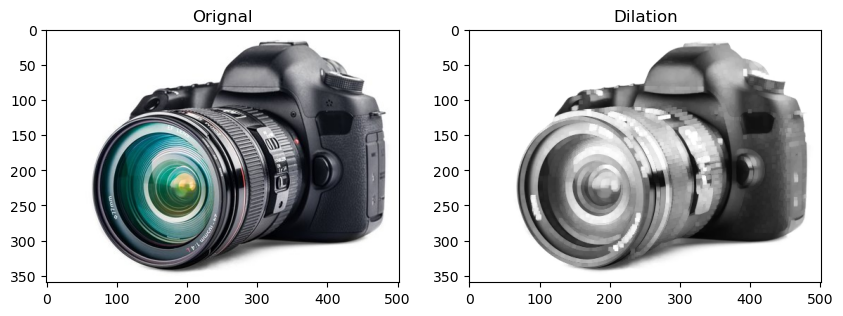

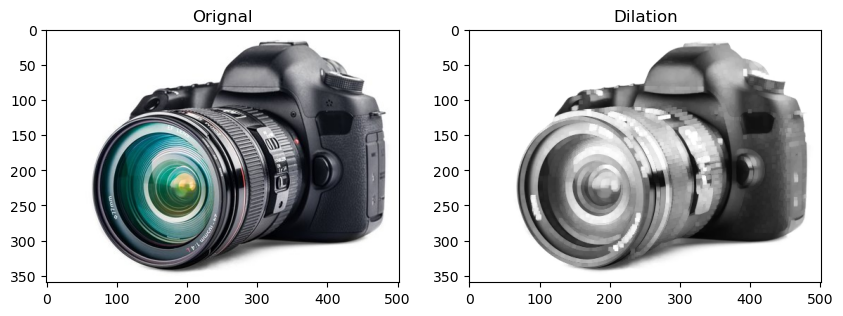

In [33]:
for i in range(1, 6):
    
    gray=get_grayscale(img)

    image_dilation=dilation(gray, iterations=i)

    plot_image(img, image_dilation, title_2="Dilation")

In [34]:
def opening(image, kernel=(5, 5)):
    return cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel=np.ones(kernel, np.uint8))

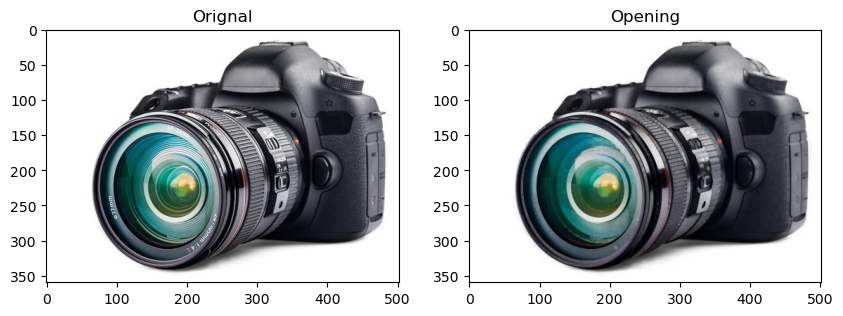

In [35]:
image_opening=opening(img, (3, 3))

plot_image(img, image_opening, title_2="Opening")

In [36]:
def closing(image, kernel=(5, 5)):
    closing = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel=np.ones(kernel, np.uint8))
    return closing


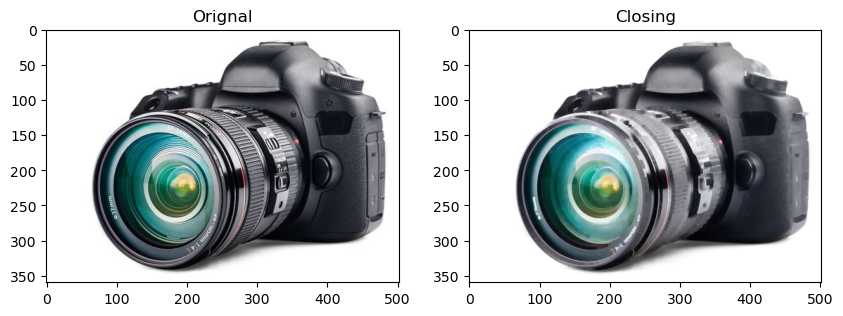

In [37]:
image_closing=closing(img, (4, 4))

plot_image(img, image_closing, title_2='Closing')

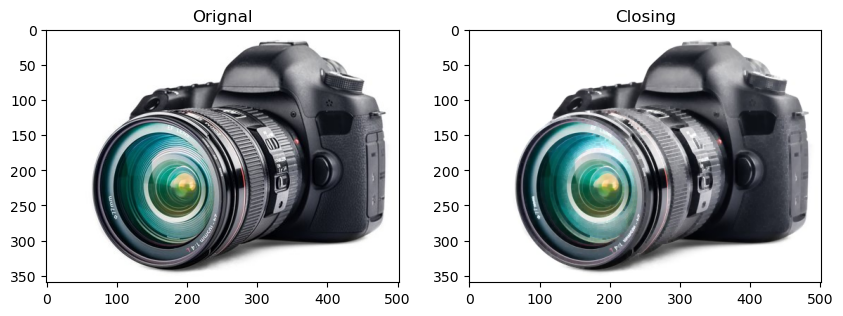

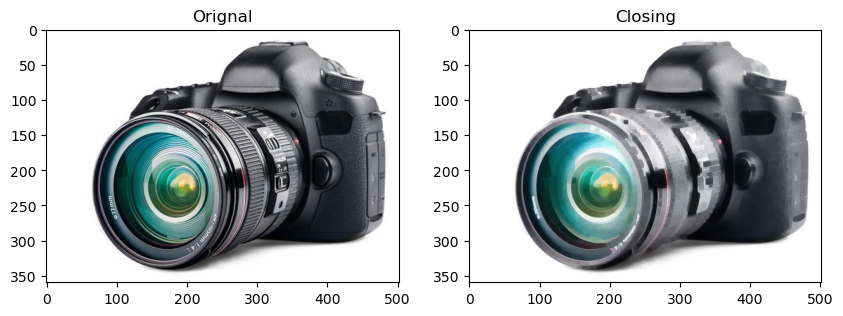

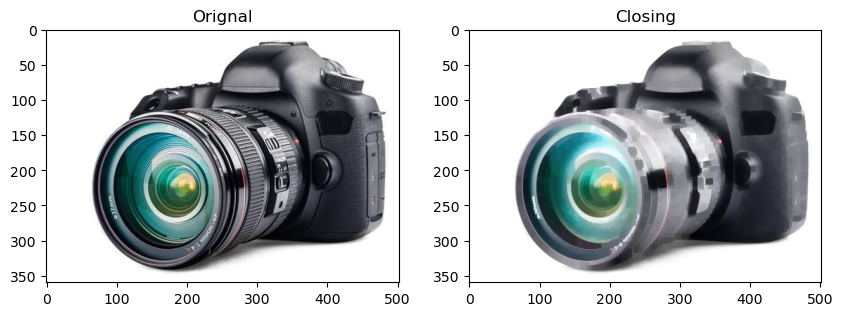

In [38]:
kernel_sizes = [(3, 3), (5, 5), (7, 7)]

for k_s in kernel_sizes:
    
    image_closing=closing(img, k_s)

    plot_image(img, image_closing, title_2='Closing')

In [39]:
def morphological_gradient(image, kernel=(2, 2)):
    
    gradient = cv2.morphologyEx(image, cv2.MORPH_GRADIENT, kernel=np.ones((2, 2), np.uint8))
    
    return gradient

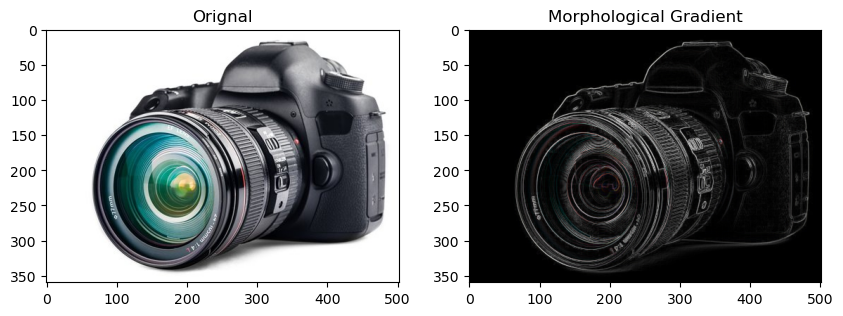

In [40]:
image_gradient=morphological_gradient(img, (5, 5))

plot_image(img, image_gradient, title_2="Morphological Gradient")

In [41]:
def top_hat(image, kernel=(5, 5)):
    
    tophat = cv2.morphologyEx(image, cv2.MORPH_TOPHAT, kernel=np.ones(kernel, np.uint8))
    
    return tophat

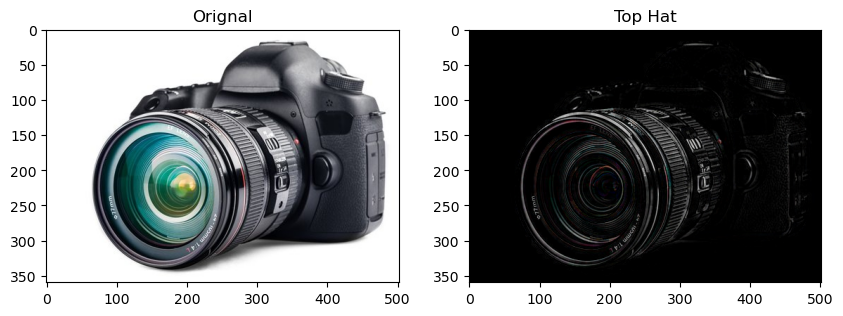

In [42]:
image_top_hat=top_hat(img)

plot_image(img, image_top_hat,title_2= "Top Hat")

In [43]:
def black_hat(image, kernel=(4, 4)):
    
    blackhat = cv2.morphologyEx(image, cv2.MORPH_BLACKHAT, kernel=np.ones(kernel, np.uint8))
    
    return blackhat

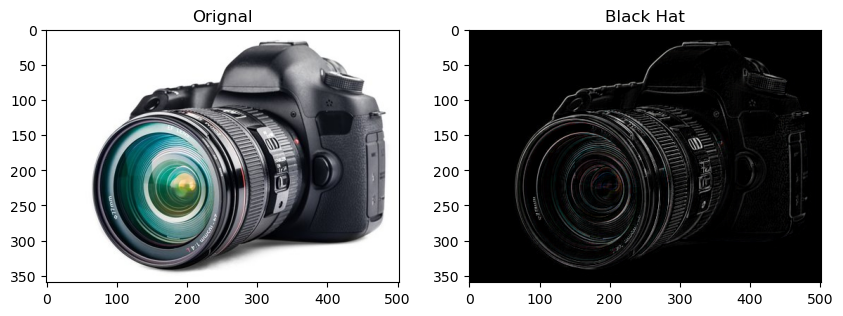

In [44]:
image_black_hat=black_hat(img)

plot_image(img, image_black_hat, title_2="Black Hat")

Section 8(Edge Detection) :-

In [45]:
def laplacian(image):
    
    lap=np.uint8(np.absolute(cv2.Laplacian(image,cv2.CV_64F, ksize=1)))
    
    return  lap

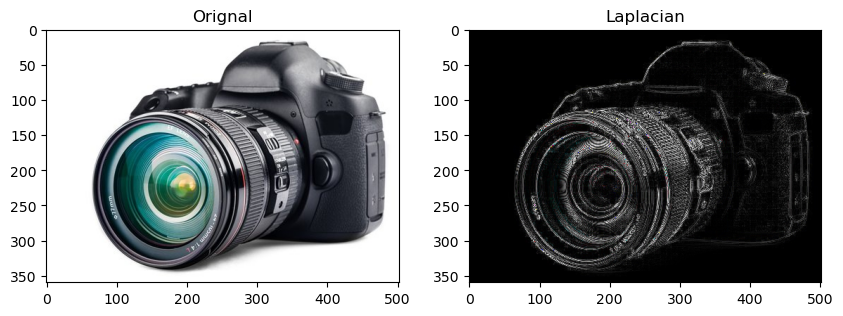

In [46]:
image_lap=laplacian(img)

plot_image(img, image_lap, title_2="Laplacian")

In [47]:
def canny(image, th1=100, th2=200, apertureSize=3):
    return cv2.Canny(image, threshold1=th1, threshold2=th2, apertureSize=apertureSize)

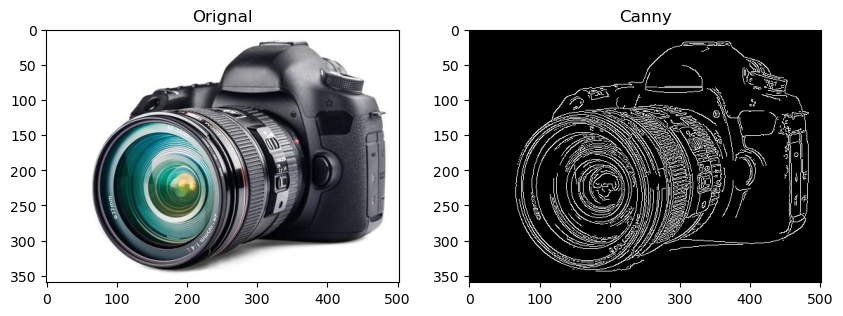

In [48]:
image_canny=canny(img)

plot_image(img, image_canny, title_2="Canny")

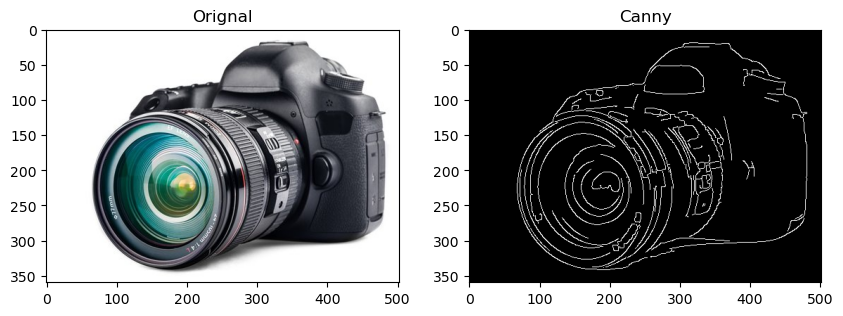

In [50]:
gray=get_grayscale(img)

def gaussian_blur(image, kernel_size=(5, 5)):
    return cv2.GaussianBlur(image, kernel_size, 0)
    
blurred=gaussian_blur(gray, (5, 5))

dilated=dilation(blurred)

image_canny=canny(dilated)

plot_image(img, image_canny, title_2="Canny")

In [51]:

def sobel(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    vertical = np.uint8(np.absolute(cv2.Sobel(image,cv2.CV_64F, 1,0, ksize=1)))
    horizon = np.uint8(np.absolute(cv2.Sobel(image,cv2.CV_64F, 0,1, ksize=1)))
    
    Sobel = cv2.bitwise_or(vertical, horizon)
   
    return vertical, horizon, Sobel

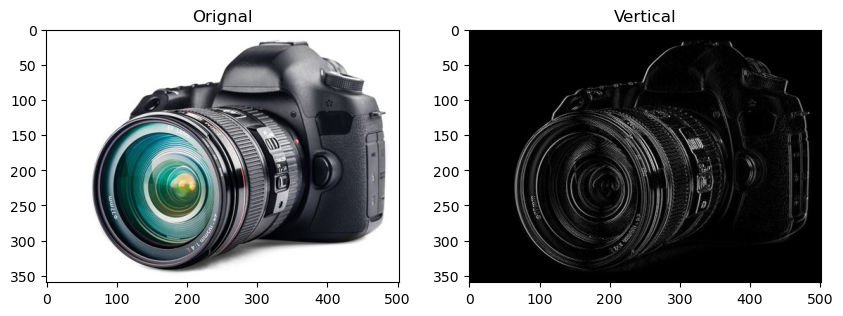

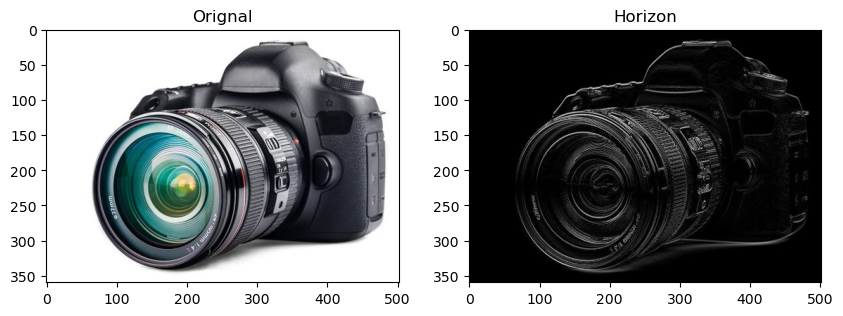

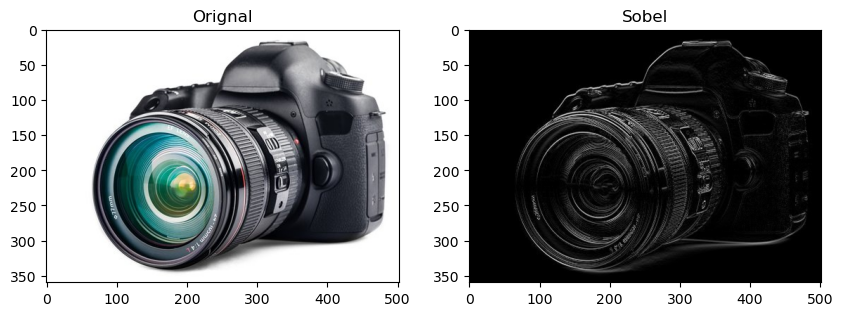

In [52]:
image = get_grayscale(img)

vertical, horizon, Sobel=sobel(image)

plot_image(img, vertical, title_2="Vertical")

plot_image(img, horizon, title_2="Horizon")

plot_image(img, horizon, title_2="Sobel")

Section 9(Transformation):-

In [53]:
def resize(pic):
    img=pic.copy()
    scale_percent = 500/img.shape[0]
    width = int(img.shape[1] * scale_percent )
    height = int(img.shape[0] * scale_percent )
    dim = (width, height)
  
    resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
    
    return resized

In [54]:
img = resize(img)

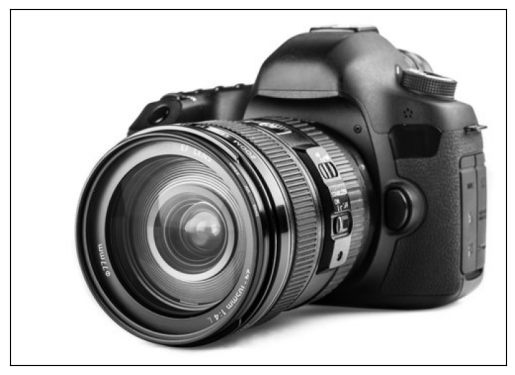

In [55]:
gray = get_grayscale(img)

show(gray)

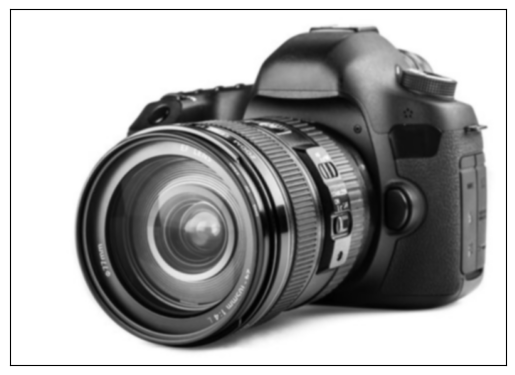

In [56]:
blurred = gaussian_blur(gray, (5, 5))
show(blurred)

In [57]:
def detect_white_region(blurred_image, kernel=(3, 3)):

    squareKernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernel)
    dilated = cv2.dilate(blurred, squareKernel)
    
    edge=canny(dilated)
    
    show(edge)
    
    return edge

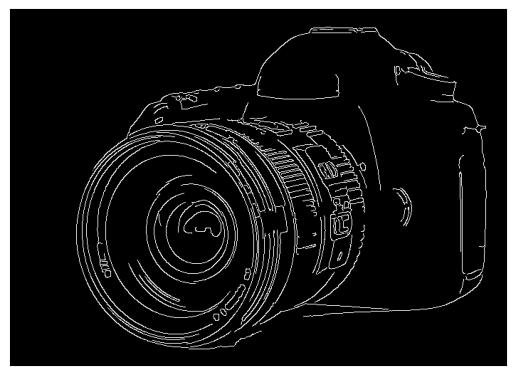

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [58]:
detect_white_region(blurred, (3, 3))

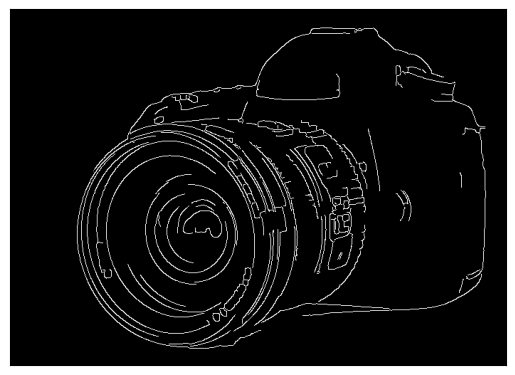

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [59]:
detect_white_region(blurred, (5, 5))

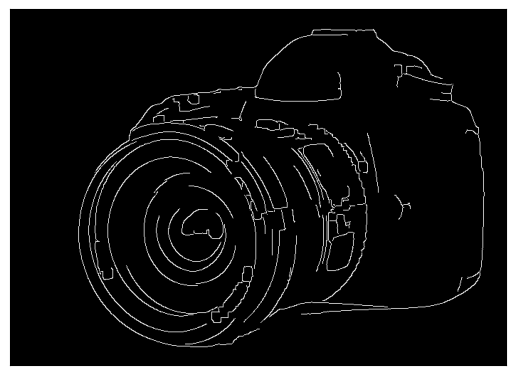

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [60]:
detect_white_region(blurred, (9, 9))

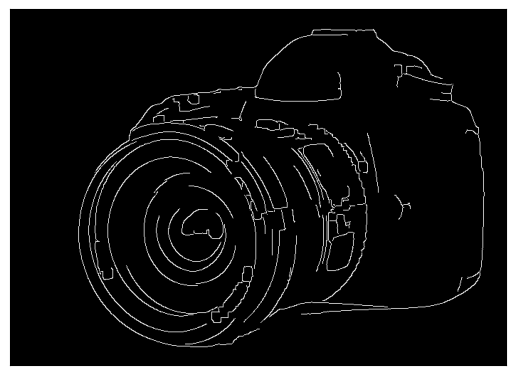

In [61]:
edged=detect_white_region(blurred, (9, 9))

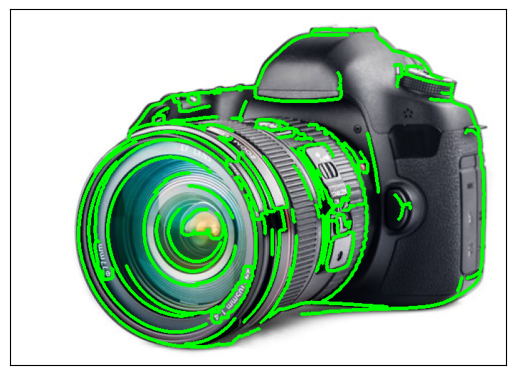

In [63]:
contours, hierarchy = cv2.findContours(edged, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
image_with_contours = cv2.drawContours(img.copy(), contours, -1, (0,255,0), 3)
show(image_with_contours)

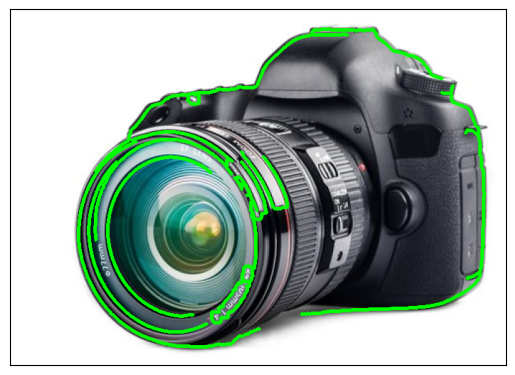

In [65]:
largest_contours = sorted(contours, key = cv2.contourArea, reverse = True)[:10]
image_with_largest_contours = cv2.drawContours(img.copy(), largest_contours, -1, (0,255,0), 3)
show(image_with_largest_contours)

In [66]:
def approximate_contour(contour):
    perimeter = cv2.arcLength(contour, True)
    
    approximatedShape = cv2.approxPolyDP(contour, 0.032 * perimeter, True)
    
    return approximatedShape

In [67]:
def contour_4(contours):
    for contour in contours:
        
        polygon_shape=approximate_contour(contour)
        
        if len(polygon_shape)==4:
            
            return polygon_shape
        

In [68]:
rec_contour=contour_4(largest_contours)
print(rec_contour)

[[[607  97]]

 [[426  29]]

 [[120 227]]

 [[427  29]]]


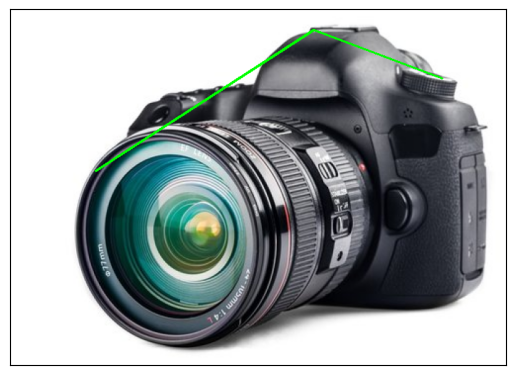

In [70]:
image_with_rec_contour = cv2.drawContours(img.copy(), [rec_contour], -1, (0, 255, 0), 2)
show(image_with_rec_contour)

END OF IMAGE PROCESSING FROM SECTION 6-9